## Generate plots from saved deconvolution results

In [1]:
import warnings
import os
import itertools
import torch
import numpy as np
import pandas as pd
import scipy as sp
import scanpy as sc
import anndata as ad
import matplotlib
import matplotlib.pyplot as plt
from plotnine import *
from smoother.visualization import *

### Load saved deconvolution results

In [2]:
res_dir = "/Users/jysumac/Projects/Smoother_paper/results/embryo_cutntag/"

method_names = ['nnls', 'nnls_sp', 'card', 'card_sp']
p_inf_list = [np.loadtxt(f"{res_dir}/H3K4me3.50um_{name}.txt") 
              for name in method_names]

ct_names = pd.read_csv(f"{res_dir}/cell_type_names.txt", sep="\t", header=None).loc[:,0]

coords = pd.read_csv(f"{res_dir}/H3K4me3.50um.coord.csv",
                     header=0, index_col=0)

sp = pd.read_csv(f"{res_dir}/H3K4me3.50um_gene_activity_score.csv", header=0, index_col=0).transpose()
coords = coords.loc[sp.index,:]

In [3]:
coords_xy = coords[['imagecol', 'imagerow']]
coords_xy['imagerow'] = - coords_xy['imagerow']
coords_xy.columns = ['x', 'y']

### Cluster by cell type proportion (Fig 3i)

/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/umap/distances.py:108

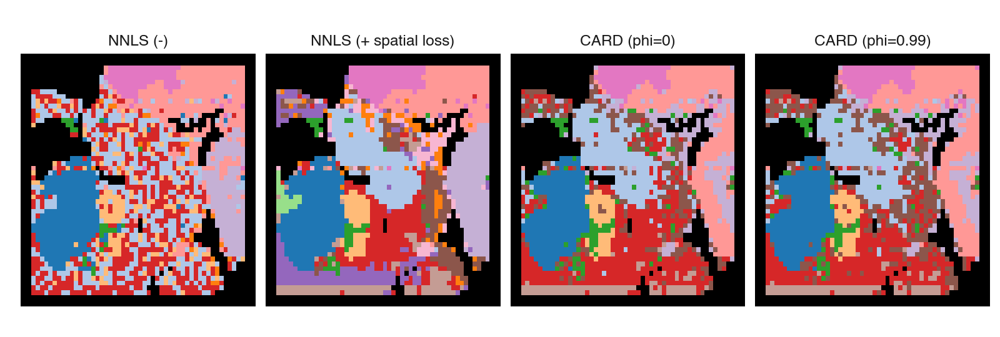

<Figure Size: (800 x 270)>

In [4]:
cmap = plt.get_cmap("tab20")
colors = [matplotlib.colors.to_hex(c) for c in cmap.colors]

p = cluster_and_plot_celltype_props(
    p_inf_list, coords_xy, names = ['NNLS (-)', 'NNLS (+ spatial loss)', 'CARD (phi=0)', 'CARD (phi=0.99)'], 
    n_col = 4, transform = 'pca', n_neighbors = 24, res = 0.8
)
(
    p + theme(
        figure_size=(8, 2.7),
        panel_background=element_rect(fill = 'black'),
        legend_position='none'
    ) + scale_fill_manual(values = colors)
)

### Plot all cell types (Fig S21-22)

#### NNLS (+ spatial loss)

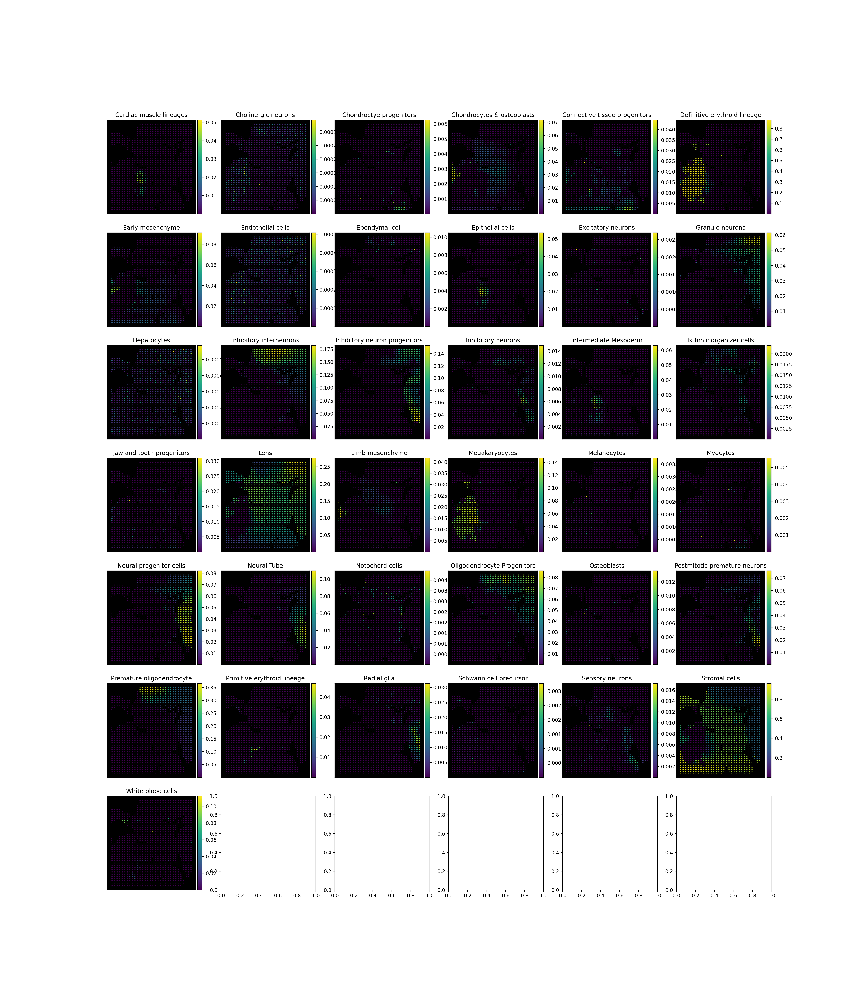

In [5]:
plot_celltype_props(p_inf_list[1], coords_xy, cell_type_names = ct_names, n_col = 6)

#### CARD (phi=0.99)

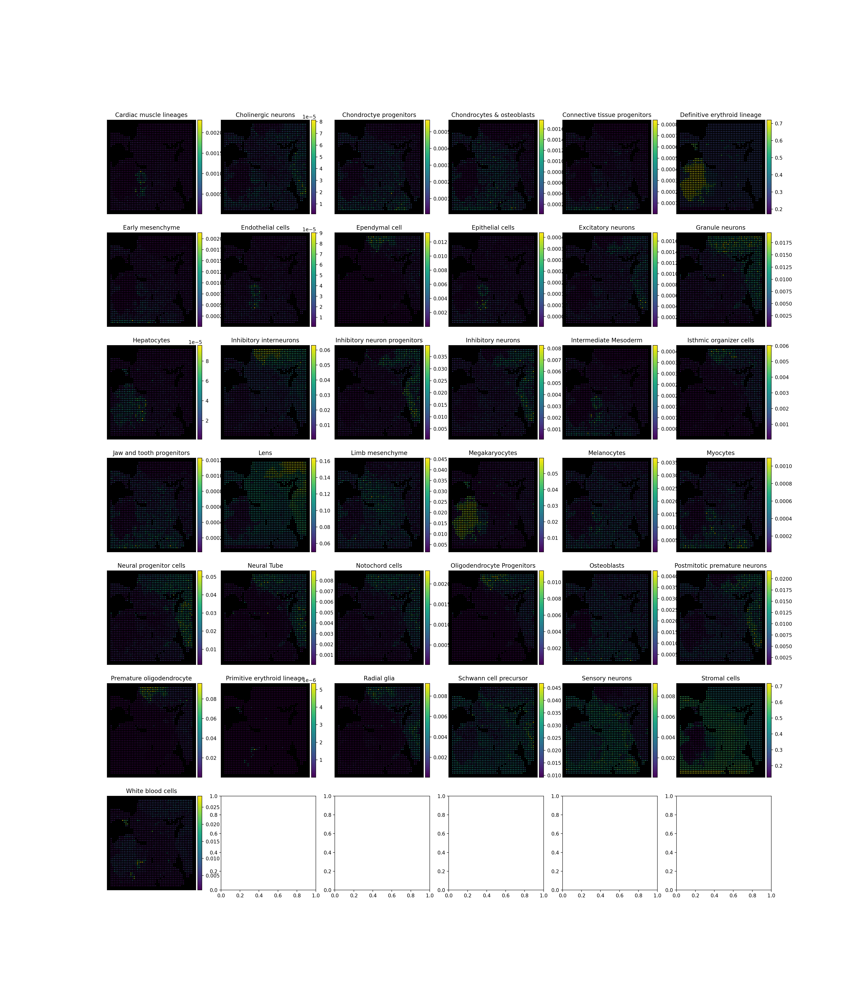

In [6]:
plot_celltype_props(p_inf_list[3], coords_xy, cell_type_names = ct_names, n_col = 6)

### Visualize cell type proportion by major lineage (Fig 3j)

In [7]:
ct_groups = {
    'Neurons & neural tube': [
        'Cholinergic neurons',
        'Excitatory neurons', 
        'Granule neurons',
        'Neural progenitor cells', 
        'Neural Tube', 
        'Notochord cells',
        'Sensory neurons', 
        'Inhibitory interneurons',
        'Inhibitory neuron progenitors', 
        'Postmitotic premature neurons', 
        'Inhibitory neurons'
    ],
    'Glia cells': [
        'Oligodendrocyte Progenitors', 
        'Premature oligodendrocyte',
        'Ependymal cell',
        'Schwann cell precursor', 
        'Radial glia'
    ],
    'Chondrocytes & osteoblasts & mesenchyme': [
        'Chondroctye progenitors', 
        'Chondrocytes & osteoblasts',
        'Osteoblasts',
        'Connective tissue progenitors',
        'Early mesenchyme', 
        'Limb mesenchyme'
    ],
    'Erythroid': [
        'Primitive erythroid lineage', 
        'Definitive erythroid lineage',
        'Megakaryocytes',
        'White blood cells'
    ], 
    'Cardiac muscle': [
        'Cardiac muscle lineages', 
        'Myocytes'
    ]
}

ct_colors = {
    'Neurons & neural tube': '#e41a1c', 
    'Glia cells': '#377eb8', 
    'Chondrocytes & osteoblasts & mesenchyme': '#4daf4a',
    'Erythroid': '#984ea3', 
    'Cardiac muscle': '#ffff33'
}

In [8]:
def prop2alpha(props):
    if isinstance(props, pd.DataFrame):
        p = props.to_numpy()
    else:
        p = props

    # scale maximum props to 1
    return p / (p.max(axis = 0, keepdims = True) + 1e-8)

def res2df(p_inf, ct_names = ct_names, ct_groups = ct_groups, coords = coords): 
    # merge ct proportions per group
    props_list = []
    for g, ct_to_plot in ct_groups.items():
        ct_idx = [np.where(ct_names == ct)[0][0] for ct in ct_to_plot]
        props_g = p_inf[:, ct_idx].sum(1, keepdims = True)
        props_list.append(props_g)
    
    # merge all results
    df = pd.DataFrame(
        np.concatenate([coords, *props_list], axis=1),
        columns = ['y', 'x', *list(ct_groups.keys())]
    )
    
    return df

def merge_all_method_dfs(df_list, ct_to_plot):
    df = pd.concat(df_list)
    
    # scale per cell type
    props = df[ct_to_plot]
    df[ct_to_plot] = prop2alpha(props)
    
    # convert props to alpha
    df = pd.melt(df, id_vars=['x', 'y', 'method'],
                 value_vars=ct_to_plot,
                 var_name='celltype', value_name='alpha'
                )
    return df

In [9]:
ct_to_plot = [
    'Neurons & neural tube', 
    'Glia cells', 
    'Chondrocytes & osteoblasts & mesenchyme',
    'Erythroid', 
    'Cardiac muscle'
]
method_to_plot = ['nnls', 'nnls_sp', 'card', 'card_sp']
method_to_plot_names = ['NNLS (-)', 'NNLS (+ spatial loss)', 'CARD (-)', 'CARD (+ spatial loss)']
n_method = len(method_to_plot)

df_all = []
for m_id, name in enumerate(method_to_plot_names): 
    p_inf = p_inf_list[m_id]
    df = res2df(p_inf)
    df['method'] = name
    df_all.append(df)

# highlighting the predict heart area
is_heart = df_all[1]['Cardiac muscle'] >= 0.02
for df in df_all:
    df['Is heart'] = is_heart

# concat and melt all proportion results
df_all_long_prop = pd.concat(df_all)
df_all_long_prop = pd.melt(
    df_all_long_prop, id_vars=['x', 'y', 'method', 'Is heart'],
    value_vars=ct_to_plot,
    var_name='celltype', value_name='props'
)
df_all_long_prop['method'] = pd.Categorical(
    df_all_long_prop['method'], categories=method_to_plot_names, ordered=True
)

# concat and convert proportions to alpha values
df_all_long_alpha = merge_all_method_dfs(df_all, ct_to_plot)
df_all_long_alpha['method'] = pd.Categorical(
    df_all_long_alpha['method'], categories=method_to_plot_names, ordered=True
)

In [10]:
df_all[0]

,y,x,Neurons & neural tube,Glia cells,Chondrocytes & osteoblasts & mesenchyme,Erythroid,Cardiac muscle,method,Is heart
0,398.0,1618.0,0.175872,0.125307,0.000352,0.000838,0.000371,NNLS (-),False
1,420.0,1618.0,0.214674,0.131608,0.000569,0.000908,0.000275,NNLS (-),False
2,442.0,1618.0,0.259816,0.056475,0.000635,0.000718,0.000142,NNLS (-),False
3,464.0,1618.0,0.246435,0.059109,0.000308,0.000371,0.000140,NNLS (-),False
4,486.0,1618.0,0.210273,0.073080,0.000464,0.000681,0.000147,NNLS (-),False
...,...,...,...,...,...,...,...,...,...
2036,1344.0,540.0,0.000130,0.000086,0.000192,0.000322,0.000062,NNLS (-),False
2037,1366.0,540.0,0.000202,0.000157,0.000384,0.000841,0.000051,NNLS (-),False
2038,1388.0,540.0,0.000211,0.000112,0.000166,0.000796,0.000089,NNLS (-),False
2039,1410.0,540.0,0.000345,0.000129,0.000402,0.000665,0.000048,NNLS (-),False


#### Check heart region (Fig S20)

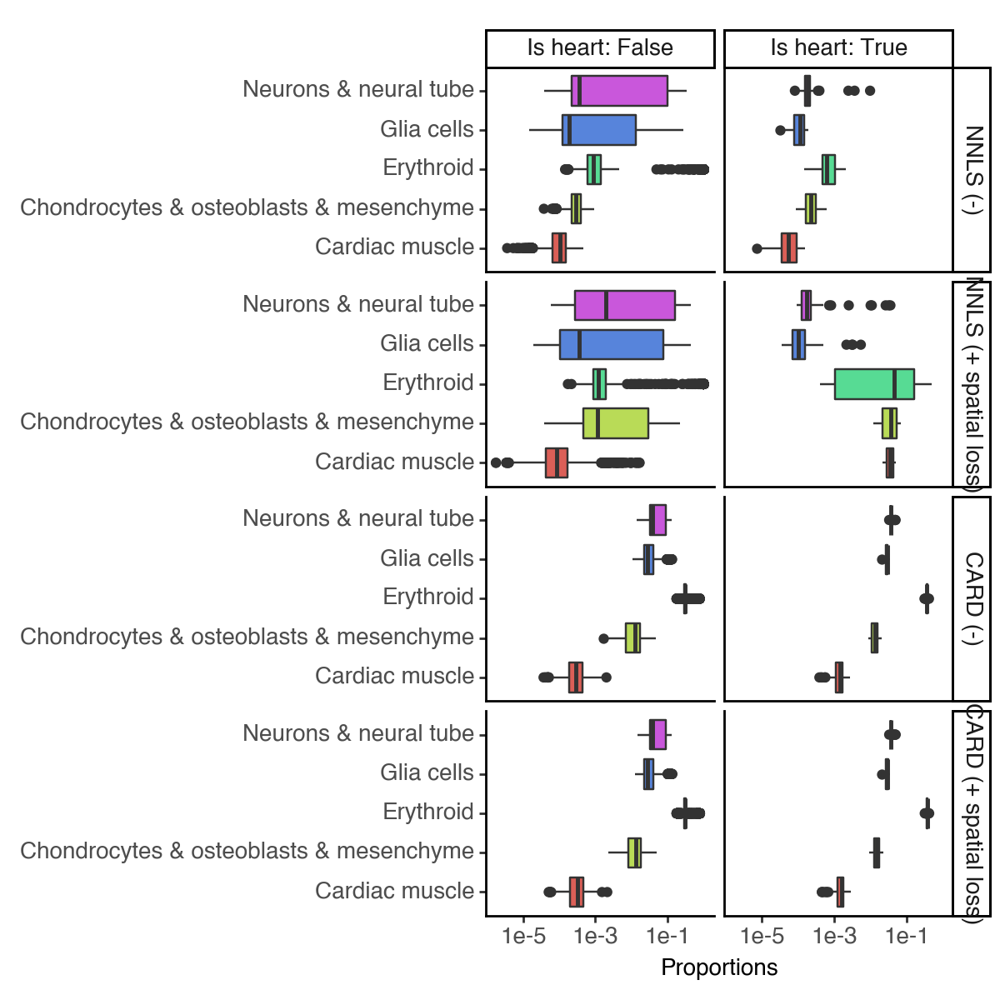

<Figure Size: (600 x 600)>

In [11]:
(
    ggplot(df_all_long_prop, aes(x='celltype', y='props', fill='celltype'))+ 
            facet_grid('method~Is heart', labeller=labeller(cols=label_both)) + 
        geom_boxplot() + 
        labs(x = '', y = 'Proportions', fill = '') + 
        scale_y_log10() + 
        coord_flip() + 
        theme_classic() + 
        theme(figure_size=[6,6], legend_position='none',
             text=element_text(size=10))
)

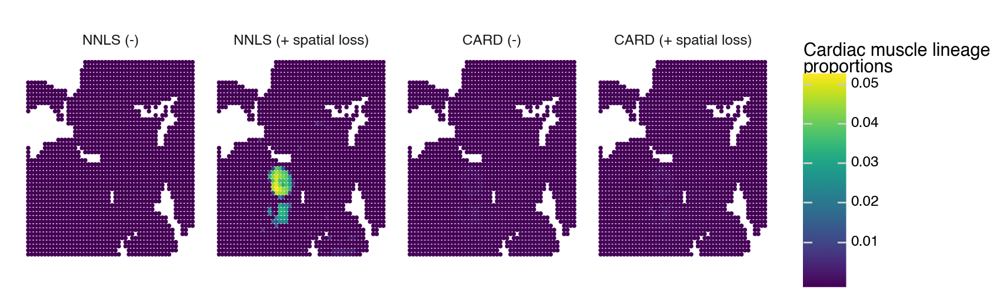

<Figure Size: (850 x 250)>

In [12]:
(
    ggplot(df_all_long_prop[df_all_long_prop['celltype'] == 'Cardiac muscle'],
           aes(x='x',y='-y')) +
        facet_wrap('~method', nrow=1) + 
        geom_point(aes(color='props'), size = 0.5) + 
        labs(color = 'Cardiac muscle lineage\nproportions') + 
        theme_void() + 
        theme(figure_size=(8.5,2.5))
)

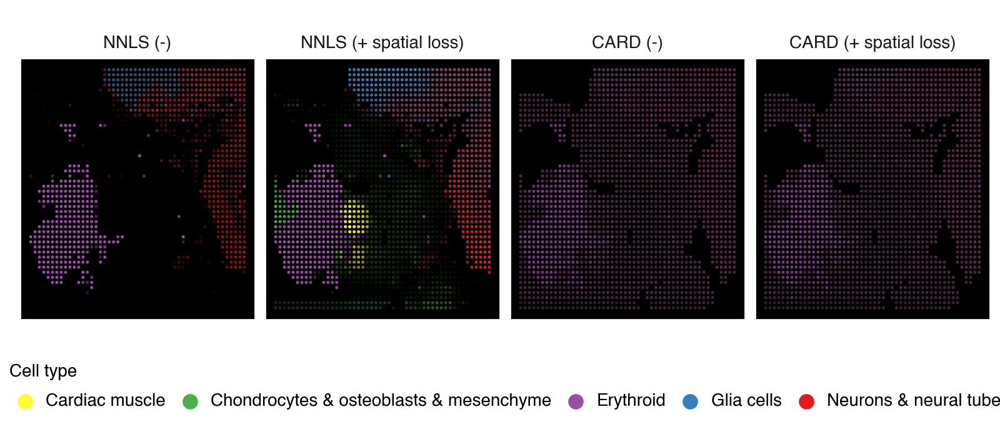

<Figure Size: (800 x 350)>

In [13]:
fontsize = 10
p1 = (
    ggplot(df_all_long_alpha) + 
        facet_wrap('~method', nrow = 1) + 
        geom_point(aes(x = 'x', y = '-y',
                       fill = 'celltype', alpha = 'alpha'),
                   size = 1, stroke = 0, color = 'black') + 
        scale_alpha_continuous(range = [0, 1]) + 
        scale_fill_manual(values = ct_colors) + 
        labs(fill = 'Cell type', x = '', y = '') +
        theme_void() + 
        theme(figure_size = (2*n_method, 3.5), 
              text = element_text(size = fontsize),
              axis_text_x = element_blank(),
              axis_text_y = element_blank(),
              panel_background = element_rect(fill = 'black'),
              panel_border = element_rect(color = 'white', size = 1),
              legend_position = 'bottom'
        ) + 
        guides(alpha = False,
               fill = guide_legend(override_aes = {'size':5}))
)
p1

### Visualize spatial gene activities (Fig 3k)

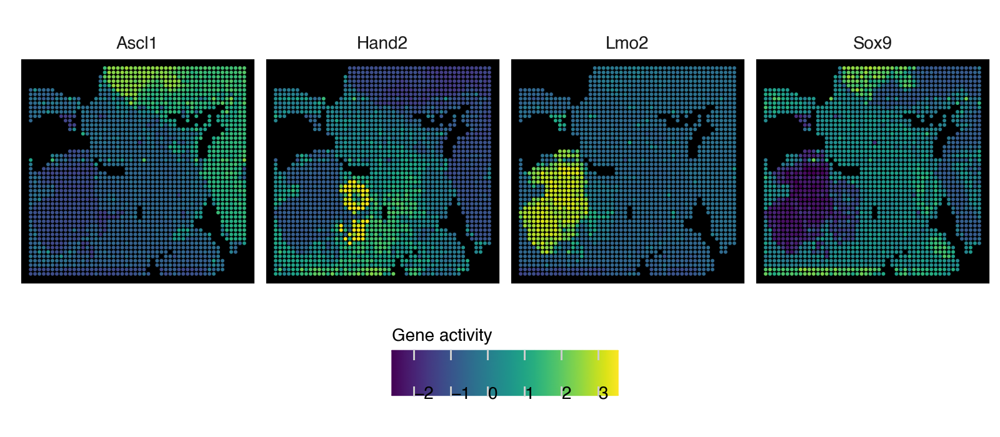

<Figure Size: (800 x 350)>

In [14]:
gene_to_plot = ['Sox9', 'Ascl1', 'Hand2', 'Lmo2']
sp_selected = sp.loc[:,gene_to_plot]
sp_scaled = (sp_selected - sp_selected.mean(axis = 0))/sp_selected.to_numpy().std(axis = 0)

df_gene = pd.concat([coords, sp_scaled], axis = 1)
df_gene.columns = ['y', 'x', *gene_to_plot]
df_gene = pd.melt(df_gene, id_vars = ['x', 'y'],
                  value_vars = gene_to_plot,
                  var_name = 'gene', value_name = 'score'
                 )

fontsize = 10
p2 = (
    ggplot(df_gene) + 
        facet_wrap('~gene', nrow = 1) + 
        geom_point(aes(x = 'x', y = '-y', color = 'score'),
                   size = 0.2) + 
        labs(color = 'Gene activity', x = '', y = '') +
        #scale_color_cmap(cmap_name='viridis') + 
        theme_void() + 
        theme(figure_size = (2*n_method, 3.5), 
              text = element_text(size = fontsize),
              axis_text_x = element_blank(),
              axis_text_y = element_blank(),
              panel_background = element_rect(fill = 'black'),
              panel_border = element_rect(color = 'white', size = 1),
              legend_position = 'bottom'
        ) + 
        guides(alpha = False,
               fill = guide_legend(override_aes = {'size':5}))
)
p2